# End-to-end Multi-class Dog Breed Classification

In [1]:
# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision"

### Get our workspace ready

In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub

# Check for GPU availability
print("GPU available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "GPU not available")

GPU available (YESSSSS!!!!)


## Getting our data ready (turning into Tensord)

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

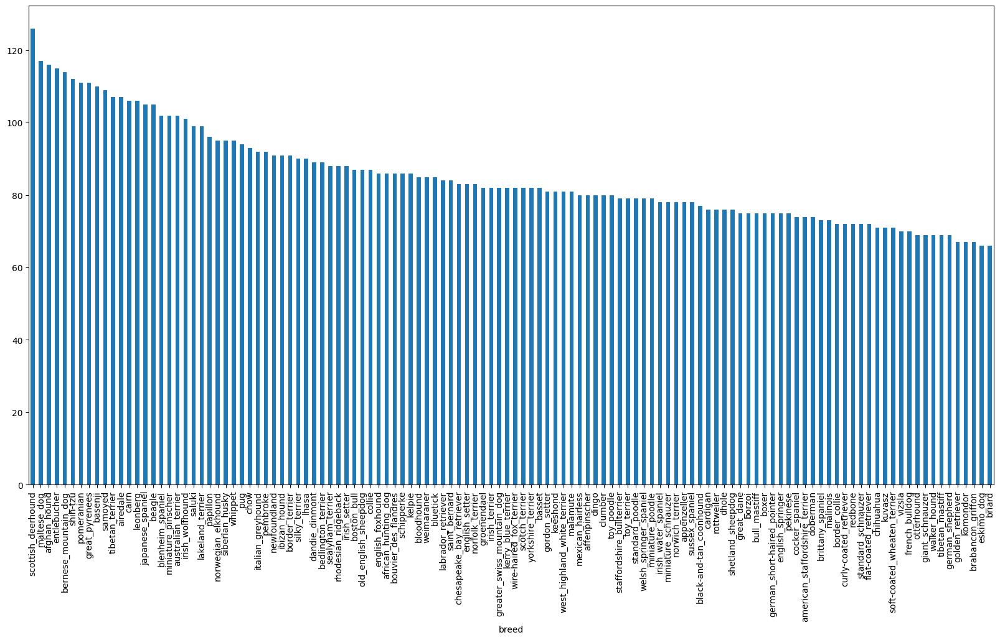

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

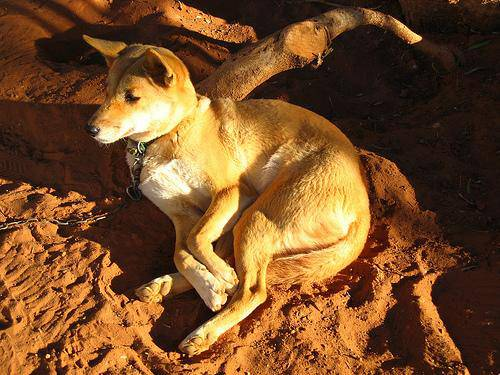

In [7]:
# Let's view an image
from IPython.display import Image
train_foldername_path = "/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/train/"
Image(f"{train_foldername_path}001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathnames from image ID's
filenames = [train_foldername_path + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learnin

In [10]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir(train_foldername_path)) == len(filenames):
  print("Filenames match actual amount of files!!! Processd.")
else:
  print("Filenames do not match actual mount of files, check the target directory")

Filenames match actual amount of files!!! Processd.


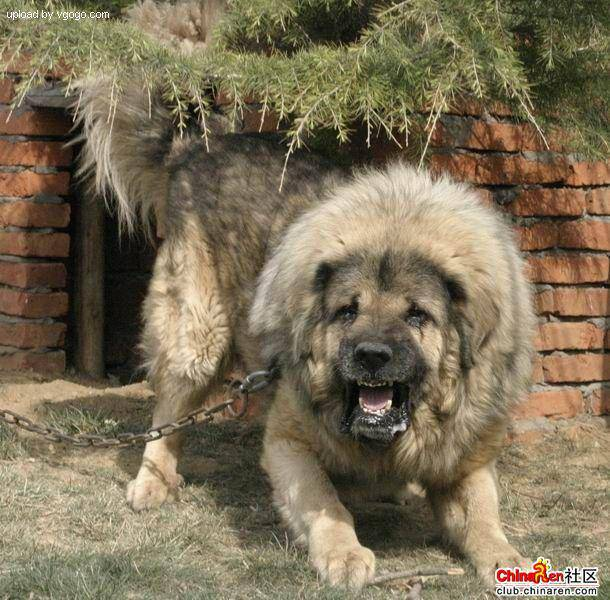

In [11]:
# One more check
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [13]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matched number of filenames")
else:
  print("Number of labels does not match number of filenames")

Number of labels matched number of filenames


In [16]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [17]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [18]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
# Turn every label into a boolen array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
# Example: Turning boolean array into integers
print(labels[0]) # orignal label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [22]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [23]:
len(X)

10222

In [24]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [25]:
# Let's split our data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [26]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Le

## Preprocessing Images (turning images into Tensors)

In [27]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [28]:
image.max(), image.min()

(255, 0)

In [29]:
(image)[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [30]:
# Turn an image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [31]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_images(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into unmerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning our data into batches

In [32]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assoicated label,
  processed the image and returns a typle of (image, label).
  """

  image = process_images(image_path)
  return image, label

In [33]:
#Demo of the above
(process_images(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [34]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset. we probable don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_images).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    # Shuffling pathsnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [35]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [36]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

In [37]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

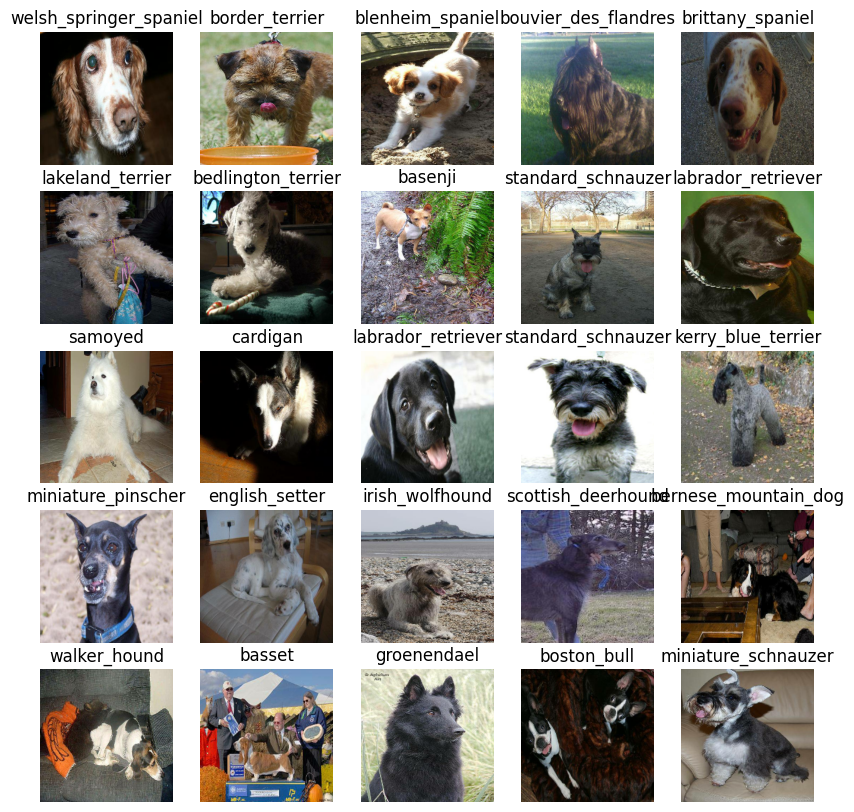

In [38]:
# Mow let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

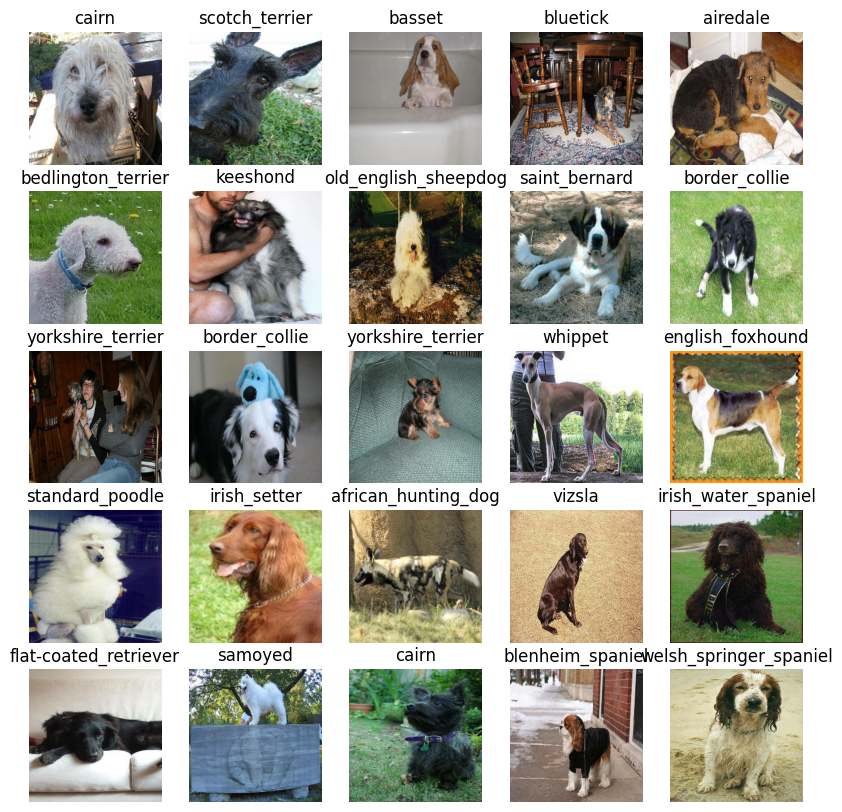

In [39]:
# Mow let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

In [40]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup moddel URL form Tensorflow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2" # https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification

In [41]:
import tf_keras
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer=tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [42]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks

### TensorBoard Callback

In [43]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [44]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

In [45]:
# Create early stopping callback
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

In [46]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [47]:
# Check to make sure we're still running on GPU
print("GPU available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "GPU not available")

GPU available (YESSSSS!!!!)


In [48]:
from inspect import modulesbyfile
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everyime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitterd model
  return model

In [49]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 118s 104ms/step - loss: 4.5914 - accuracy: 0.0925 - val_loss: 3.6178 - val_accuracy: 0.1950
Epoch 2/100
25/25 [==============================] - 2s 65ms/step - loss: 1.6193 - accuracy: 0.7000 - val_loss: 2.2898 - val_accuracy: 0.4400
Epoch 3/100
25/25 [==============================] - 2s 61ms/step - loss: 0.5503 - accuracy: 0.9538 - val_loss: 1.8045 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 2s 60ms/step - loss: 0.2476 - accuracy: 0.9875 - val_loss: 1.5919 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 2s 61ms/step - loss: 0.1443 - accuracy: 0.9962 - val_loss: 1.5000 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 1s 59ms/step - loss: 0.0985 - accuracy: 1.0000 - val_loss: 1.4525 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==================

### Checking the TensorBoard logs

In [50]:
%tensorboard --logdir "/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/logs"

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [51]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 39ms/step


array([[2.6864780e-03, 3.8775997e-05, 6.9897616e-04, ..., 2.1868027e-04,
        3.9234761e-05, 2.0817652e-02],
       [3.7601669e-03, 1.7938967e-04, 2.9358941e-03, ..., 4.8452857e-04,
        7.0425280e-04, 8.8525783e-05],
       [2.8070845e-06, 1.1744718e-05, 4.8839415e-06, ..., 4.9674140e-06,
        1.4698409e-05, 1.4131427e-05],
       ...,
       [2.3558709e-06, 6.1524679e-06, 1.6146767e-05, ..., 2.8543895e-05,
        2.6680920e-05, 8.7928267e-05],
       [1.6360062e-03, 1.3447841e-04, 5.2045049e-05, ..., 3.1065752e-05,
        6.2803729e-06, 8.4224064e-03],
       [1.2951800e-04, 7.9962920e-05, 1.4647879e-03, ..., 5.9286202e-03,
        3.5266191e-04, 3.1209373e-05]], dtype=float32)

In [60]:
predictions[0]

array([2.68647796e-03, 3.87759974e-05, 6.98976160e-04, 2.30538222e-04,
       2.14136802e-04, 8.95406338e-05, 5.41898422e-03, 3.62501654e-04,
       1.17805073e-04, 5.24326880e-03, 7.18172989e-04, 1.97252884e-04,
       7.62170748e-05, 8.04395750e-05, 8.91212374e-04, 1.86829027e-04,
       5.85204725e-05, 8.94717202e-02, 1.90649025e-05, 1.38380565e-04,
       1.33374459e-04, 1.69566119e-04, 8.91788295e-06, 1.22454323e-04,
       1.42544130e-04, 3.14049918e-04, 2.43756413e-01, 5.32188533e-05,
       2.54803407e-03, 2.14562620e-04, 3.95884214e-04, 8.56489234e-04,
       2.19424488e-04, 4.09996574e-05, 2.93127319e-04, 1.04769012e-02,
       5.14373023e-05, 3.72284849e-04, 4.20755940e-04, 1.12796544e-04,
       2.10484839e-03, 1.98958041e-05, 6.12491494e-05, 2.17108784e-04,
       2.64313603e-05, 4.09842141e-05, 2.31954356e-04, 2.82623630e-04,
       6.22663647e-04, 1.17655407e-04, 1.70456318e-04, 1.93184987e-05,
       9.65002473e-05, 4.80167691e-05, 1.86158955e-04, 1.32686517e-04,
      

In [63]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.97008121e-04 3.04831137e-05 2.68948625e-05 6.78308788e-05
 3.48198297e-03 2.81760058e-05 3.09960051e-05 1.20254327e-03
 1.72835197e-02 3.08238082e-02 2.49255663e-05 4.87157968e-06
 8.54128331e-04 5.00693079e-03 1.01780344e-03 2.87101883e-03
 4.23210668e-06 2.47801014e-04 1.73837412e-04 5.25028678e-04
 1.72238855e-04 4.77829395e-04 1.36395365e-05 6.82315658e-05
 6.91680005e-03 2.60683646e-05 1.04177379e-05 2.21002745e-04
 6.56287069e-04 2.66505958e-05 1.43745390e-04 1.12096241e-04
 3.65165397e-05 2.50459270e-04 4.39910618e-05 6.05187524e-05
 5.90499549e-05 1.94138018e-04 6.89760491e-05 3.78259778e-01
 6.73290124e-05 8.60204364e-06 4.62638121e-03 1.20498844e-05
 9.61893820e-04 4.35915208e-05 9.96239134e-04 1.50360414e-04
 4.91703904e-05 4.23070378e-05 1.08098291e-04 3.29923816e-04
 1.04259540e-04 3.11299041e-03 3.12117409e-05 1.46967848e-03
 1.10347304e-04 4.07195912e-05 1.40428529e-04 2.30388887e-05
 2.11044244e-04 1.07409037e-03 3.10897735e-06 1.79267099e-05
 5.01203031e-05 4.172567

In [113]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [114]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [115]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

  images_[0], labels_[0]

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [118]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Gtet he pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)

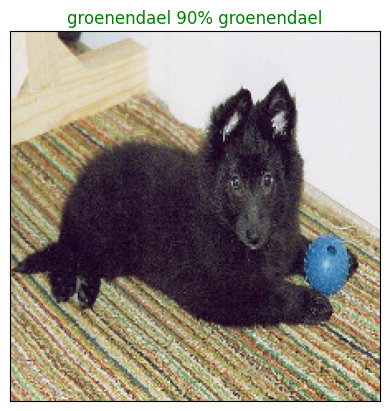

In [121]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [134]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get he pred label
  pred_label = get_pred_label(pred_prob)

  # Find top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

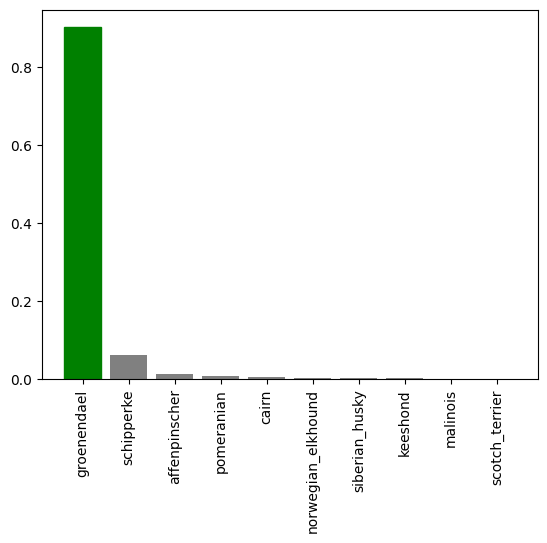

In [136]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=77)

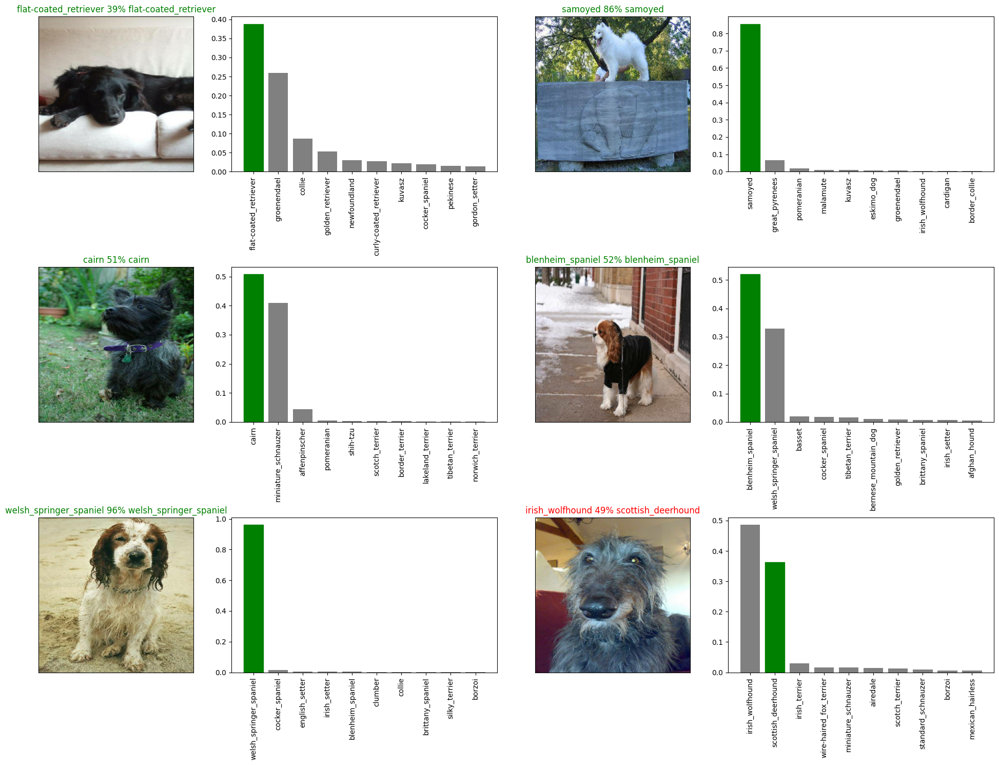

In [141]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [145]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".keras" # save format of model
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path

In [146]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f'Loading saved model from: {model_path}')
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [147]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/models/20241119-221506-1000-images-mobilenetv2-Adam.keras....


'/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/models/20241119-221506-1000-images-mobilenetv2-Adam.keras'

In [148]:
# Load a trained model
loaded_1000_images_model = load_model('/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/models/20241119-221506-1000-images-mobilenetv2-Adam.keras')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/models/20241119-221506-1000-images-mobilenetv2-Adam.keras


In [150]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 0s 47ms/step - loss: 1.2974 - accuracy: 0.6750


[1.297356128692627, 0.675000011920929]

In [151]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 40ms/step - loss: 1.2974 - accuracy: 0.6750


[1.297356128692627, 0.675000011920929]

## Training a big dog model (on the full data)

In [152]:
len(X), len(y)

(10222, 10222)

In [153]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [154]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [155]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [156]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

Running the cell below will take a long time

In [158]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 19s 48ms/step - loss: 1.3423 - accuracy: 0.6737
Epoch 2/100
320/320 [==============================] - 15s 48ms/step - loss: 0.3960 - accuracy: 0.8816
Epoch 3/100
320/320 [==============================] - 15s 47ms/step - loss: 0.2357 - accuracy: 0.9355
Epoch 4/100
320/320 [==============================] - 15s 48ms/step - loss: 0.1533 - accuracy: 0.9621
Epoch 5/100
320/320 [==============================] - 15s 48ms/step - loss: 0.1059 - accuracy: 0.9786
Epoch 6/100
320/320 [==============================] - 15s 47ms/step - loss: 0.0771 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 15s 47ms/step - loss: 0.0567 - accuracy: 0.9922
Epoch 8/100
320/320 [==============================] - 15s 47ms/step - loss: 0.0473 - accuracy: 0.9935
Epoch 9/100
320/320 [==============================] - 15s 47ms/step - loss: 0.0366 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 15s 47ms/step - l

In [159]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/models/20241119-223402-full-image-set-mobilenetv2-Adam.keras....


'/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/models/20241119-223402-full-image-set-mobilenetv2-Adam.keras'

In [160]:
# Load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/models/20241119-223402-full-image-set-mobilenetv2-Adam.keras")

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/models/20241119-223402-full-image-set-mobilenetv2-Adam.keras


## Making predictions on the test dataset

In [164]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/test/e60f6620bf8751538db9006d425f1b45.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/test/e1e79b3edfb3579e46ad914bf755dbbc.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/test/def9a16cb97a7cdd10d6465d642f6bf4.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/test/e743bea73da2c0dab99ccdbc697b1ac8.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, D

In [165]:
len(test_filename)

10357

In [167]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [168]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

This is going to take a long time

In [169]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 223s 687ms/step


In [170]:
np.savetxt("/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [171]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/preds_array.csv", delimiter=",")

In [172]:
test_predictions[:10]

array([[9.00882884e-13, 2.96538030e-08, 4.29604215e-13, ...,
        8.71863080e-08, 4.98333877e-15, 4.51578445e-13],
       [2.71613754e-09, 1.50186002e-13, 1.68533134e-08, ...,
        3.30742156e-10, 2.12558771e-08, 7.19985019e-06],
       [1.54852455e-12, 6.86126889e-09, 1.31626732e-09, ...,
        1.41408786e-11, 1.90954479e-12, 6.19452434e-10],
       ...,
       [7.71754438e-10, 2.55683807e-10, 6.54841514e-08, ...,
        5.40022040e-04, 4.50896165e-09, 1.46586361e-08],
       [1.84590149e-07, 1.15085435e-08, 2.93626442e-07, ...,
        6.76465334e-07, 3.67738329e-09, 4.10306939e-06],
       [1.58841385e-06, 2.15961715e-09, 5.46546586e-09, ...,
        1.10888876e-09, 1.83005941e-05, 2.23228227e-07]])

In [173]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

In [174]:
# Create a panddas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [177]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [178]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e60f6620bf8751538db9006d425f1b45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e1e79b3edfb3579e46ad914bf755dbbc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,def9a16cb97a7cdd10d6465d642f6bf4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e743bea73da2c0dab99ccdbc697b1ac8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4369279919beecfb6d91a5375bc122f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [179]:
# Ass the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e60f6620bf8751538db9006d425f1b45,9.008829e-13,2.965380e-08,4.296042e-13,2.841053e-14,2.305596e-10,1.350311e-11,1.701423e-12,5.071155e-13,2.261834e-10,...,6.308097e-13,4.291178e-13,6.344339e-11,3.802234e-07,5.641795e-10,1.992926e-11,5.139037e-11,8.718631e-08,4.983339e-15,4.515784e-13
1,e1e79b3edfb3579e46ad914bf755dbbc,2.716138e-09,1.501860e-13,1.685331e-08,2.327279e-10,5.608602e-08,8.737808e-05,1.453600e-08,3.161678e-01,7.715953e-12,...,6.898036e-07,3.495082e-01,2.580185e-09,3.193823e-10,1.135029e-08,3.305401e-08,2.038405e-06,3.307422e-10,2.125588e-08,7.199850e-06
2,def9a16cb97a7cdd10d6465d642f6bf4,1.548525e-12,6.861269e-09,1.316267e-09,1.370881e-06,4.628491e-13,7.040071e-10,3.289371e-07,6.869358e-10,2.855931e-11,...,3.160379e-14,4.875487e-12,3.704869e-11,1.052962e-10,1.040249e-09,3.615145e-13,3.950046e-11,1.414088e-11,1.909545e-12,6.194524e-10
3,e743bea73da2c0dab99ccdbc697b1ac8,1.542396e-12,2.841675e-13,3.711727e-09,4.938329e-13,4.992928e-10,1.060815e-07,2.461962e-11,1.088764e-04,6.147049e-12,...,3.535749e-12,2.984772e-07,1.152863e-09,2.455526e-08,6.552086e-10,6.917965e-07,1.378441e-10,1.651436e-08,1.444246e-07,1.978506e-07
4,e4369279919beecfb6d91a5375bc122f,4.586481e-05,7.477412e-08,8.694982e-09,3.168436e-13,1.311351e-05,1.790045e-09,1.012672e-06,2.624811e-06,2.862172e-08,...,5.362779e-03,2.282623e-04,7.475830e-08,3.927382e-07,2.203976e-07,2.986742e-08,6.661972e-01,3.385899e-09,3.979773e-06,5.559341e-05


In [180]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

In [200]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [201]:
custom_image_paths

['/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/my-dog-photos/standard_poodle.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/my-dog-photos/wire-haired fox terrier.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Complete A.I. & Machine Learning, Data Science Bootcamp/Section 14: Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2/Dog Vision/my-dog-photos/Irish Wolfhound.jpg']

In [202]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [203]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 55ms/step


In [204]:
custom_preds.shape

(3, 120)

In [205]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['standard_poodle', 'wire-haired_fox_terrier', 'irish_wolfhound']

In [208]:
# Get custom images (out unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

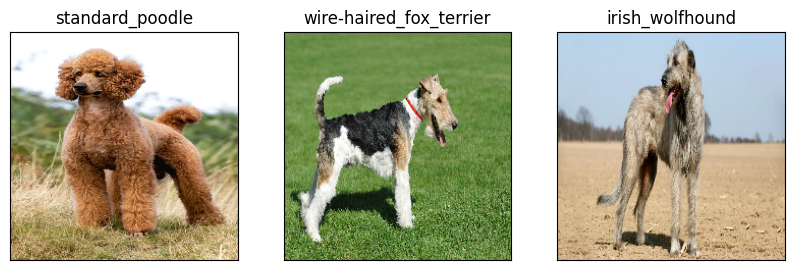

In [209]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)